In [1]:
import os
os.chdir('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/keygenestructures')

In [150]:
genome_list = pd.read_excel('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/used_geomes_Feb8.xlsx',index_col=0)
final_genomes = list(genome_list.index)
final_genomes.remove('GNM3486')
len(final_genomes)


446

In [169]:
d1 = '''HKCCD3925
HKCCD6276
HKCCD5871-2
HKCCD6426
HKCCD7181
HKCCD6647
HKCCD6647-2
HKCCD7312
HKCCD9138
HKCCD7628'''.split('\n')


### extra

In [170]:
subdf = mdf.loc[mdf.ID.isin(d1),:]
subdf = subdf.set_index('ID')
subdf = subdf.reindex(d1)
for g,row in subdf.iterrows():
    gsize = sum([len(_.seq) 
         for _ in SeqIO.parse(f"/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/ingenomes/{row['old ID']}.fna",'fasta')])
    #g2size[g] = str(round(gsize/10**6,2)) + 'Mbp'
    print(str(round(gsize/10**6,2)) + 'Mbp')
    


4.38Mbp
3.91Mbp
4.69Mbp
4.69Mbp
4.74Mbp
4.35Mbp
4.35Mbp
4.45Mbp
4.44Mbp
4.59Mbp


In [177]:
target_genes = {'K00370': 'narG',
                'K00371': 'narH',
                'K02567': 'napA',
                'K02568': 'napB',
                'K00368': 'nirK',
                'K15864': 'nirS',
                'K04561': 'norB',
                'K02305': 'norC',
                'K00376': 'nosZ',}

for g,row in subdf.iterrows():    
    _d = {target_genes[k]:v for k,v in kegg_df.loc[row['old ID'],target_genes].to_dict().items()}
    g_info = []
    for gene in [ 'narG',
 'narH',
 'napA',
 'napB',
 'nirS',
 'nirK',
 'norB',
 'norC',
 'nosZ']:
        if str(_d[gene])=='nan':
            g_info.append('-')
        else:
            g_info.append('Y')
    print(g_info)
    #g2info[g] = g_info

['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', 'Y', '-', 'Y', 'Y', 'Y']
['-', '-', 'Y', 'Y', '-', '-', '-', '-', '-']


### others

In [ ]:
mdf = pd.read_excel('/mnt/ivy/thliao/project/coral_ruegeria/info_RuegeriaUsed_20241022.xlsx',index_col=0)
subdf = mdf.loc[final_genomes]
subdf = subdf.loc[subdf.Source=='LuoLab',:]
g2pop = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/data_processing/PopCOGenT/output/MERGED_mc_20230324.tsv',sep='\t',index_col=0)
g2pop = g2pop['paper ID'].to_dict()

pop2g = defaultdict(list)
for f in subdf.index:
    pop2g[g2pop[f]].append(f)

In [ ]:
mcdf = pd.DataFrame(columns=['Ruegeria MC','Number of isolates from corals'])
for _,pop in enumerate(pop2g):
    mcdf.loc[_,:] = [pop,len(pop2g[pop])]
mcdf.to_excel('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/S1.xlsx')

In [ ]:
#g2size = {}
for g in subdf.index:
    gsize = sum([len(_.seq) 
         for _ in SeqIO.parse(f'/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/ingenomes/{g}.fna','fasta')])
    g2size[g] = str(round(gsize/10**6,2)) + 'Mbp'

In [ ]:
g2info = {}
target_genes = {'K00370': 'narG',
                'K00371': 'narH',
                'K02567': 'napA',
                'K02568': 'napB',
                'K00368': 'nirK',
                'K15864': 'nirS',
                'K04561': 'norB',
                'K02305': 'norC',
                'K00376': 'nosZ',}
for g in tqdm(subdf.index):
    _d = {target_genes[k]:v for k,v in kegg_df.loc[g,target_genes].to_dict().items()}
    g_info = []
    for gene in [ 'narG',
 'narH',
 'napA',
 'napB',
 'nirS',
 'nirK',
 'norB',
 'norC',
 'nosZ']:
        if str(_d[gene])=='nan':
            g_info.append('-')
        else:
            g_info.append('Y')
    g2info[g] = g_info

In [156]:
c = ['Genome ID',
 'Coral species',
 'Compartment',
 'Sampling site',
 'Ruegeria MC',
 'Genome size/Mbp',
 'narG',
 'narH',
 'napA',
 'napB',
 'nirS',
 'nirK',
 'norB',
 'norC',
 'nosZ']
s2df = pd.DataFrame(columns=c)
for _,g in enumerate(subdf.index):
    s2df.loc[_,:] = [g,mdf.loc[g,'host name'],
                     mdf.loc[g,'Compartment'],
                     mdf.loc[g,'Location'],
                     g2pop[g],
                     g2size[g]] + g2info[g]

NameError: name 'g2size' is not defined

In [157]:
s2df.to_excel('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/S2.xlsx')

In [159]:
!sz2 /mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/S*.xlsx

S1.xlsx                                       100% 7192     7.0KB/s   00:00    
S2.xlsx                                       100%   30KB  29.6KB/s   00:00    


# narG

In [185]:
pwd

'/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/keygenestructures'

# napA

In [163]:
from Bio import SeqIO
d3to1 = {'CYS': 'C', 'ASP': 'D', 'SER': 'S', 'GLN': 'Q', 'LYS': 'K',
'ILE': 'I', 'PRO': 'P', 'THR': 'T', 'PHE': 'F', 'ASN': 'N', 
'GLY': 'G', 'HIS': 'H', 'LEU': 'L', 'ARG': 'R', 'TRP': 'W', 
'ALA': 'A', 'VAL':'V', 'GLU': 'E', 'TYR': 'Y', 'MET': 'M'}


# Just an example input pdb
pdbfile = './2nya_napA.pdb'


from collections import defaultdict
cs = open(pdbfile).read().split('\n')
site_cs = [_.strip() for _ in cs  if _.startswith('SITE ') ]
remark_cs = [_.strip() for _ in cs  if _.startswith('REMARK ') ]
rid_first = remark_cs.index('REMARK 800 SITE')
remark_cs = remark_cs[rid_first:]

atom_cs = [_.strip() for _ in cs  if _.startswith('ATOM ') ]


preac = ''
ac2des = {}
for row in remark_cs:
    if 'SITE_IDENTIFIER: ' in row:
        acname = row.split(' ')[-1]
        preac = acname
    if 'SITE_DESCRIPTION: ' in row:
        des = row.split('SITE_DESCRIPTION: ')[-1].split('BINDING SITE FOR RESIDUE ')[-1]
        ac2des[preac] = des
def is_num(v):
    try:
        int(v)
        return True
    except:
        return False

    

AC2site = defaultdict(list)
for row in site_cs:
    rows = [_ for _ in row.split(' ') if _]
    ACname = rows[2]
    #rows = rows[:
    aa = ''
    pos = 0
    chain = ''
    for v in rows[4:]:
        if v in d3to1:
            aa = v
        if v in ['A','B']:
            chain = v
        if is_num(v):
            pos = int(v)
            AC2site[ACname].append((chain,aa,pos))
        if (not is_num(v)) and is_num(v[1:]):
            chain = v[0]
            pos = int(v[1:])
            AC2site[ACname].append((chain,aa,pos))

In [165]:
target_chain = 'A'
site2AC = defaultdict(list)
for ac,site_list in AC2site.items():
    for chain,aa,pseudo_pos in site_list:
        if chain!=target_chain:
            continue
        site2AC[str(pseudo_pos)].append((aa,ac))

realpos2AC = defaultdict(list)
chain2aa = defaultdict(str)
pre = ''
_chain = target_chain
for row in atom_cs:
    rows = [_ for _ in row.split(' ') if _]
    aa = rows[3]
    chain = rows[4]
    if pre!=rows[5]:
        pre = rows[5]
        chain2aa[chain]+=d3to1[aa]
    if rows[5] in site2AC and chain == target_chain:
        real_pos = len(chain2aa[chain])-1 # 0-coord
        realpos2AC[real_pos] = site2AC[rows[5]]
    if chain!=_chain:
        idx = 0

geno2fa = {_.id:_ for _ in SeqIO.parse(f"./napA_isolates.faa",'fasta')}

with open(pdbfile.replace('.pdb','.fasta'),'w') as f1:
    #for k,v in chain2fasta.items():
    f1.write(f">chain {target_chain}\n{chain2aa[target_chain]}\n")
    for k,v in geno2fa.items():
        f1.write(f">{k}\n{str(v.seq)}\n")

In [166]:
cmd = f"mafft {pdbfile.replace('.pdb','.fasta')} > {pdbfile.replace('.pdb','.aln')}"
print(cmd)
os.system(cmd)

mafft ./2nya_napA.fasta > ./2nya_napA.aln


0

In [169]:
renamed_d = {'chain':'REF',
'AL3':'AL3(MC1)',
'AB11':'AB11(MC6)',
'L12':'L12(MC13)',
'A5':'A5(MC0)',
'AN11':'AN11(MC26)',
#'B4':'B4(MC10)',
'AG8':'AG8(MC8_52)',}
a = list(SeqIO.parse(pdbfile.replace('.pdb','.aln'),'fasta'))
with open(pdbfile.replace('.pdb','.aln'),'w') as f1:
    for r in a:
        r.id = renamed_d.get(r.id,r.id)
    SeqIO.write(a[::-1],f1,'fasta-2line')

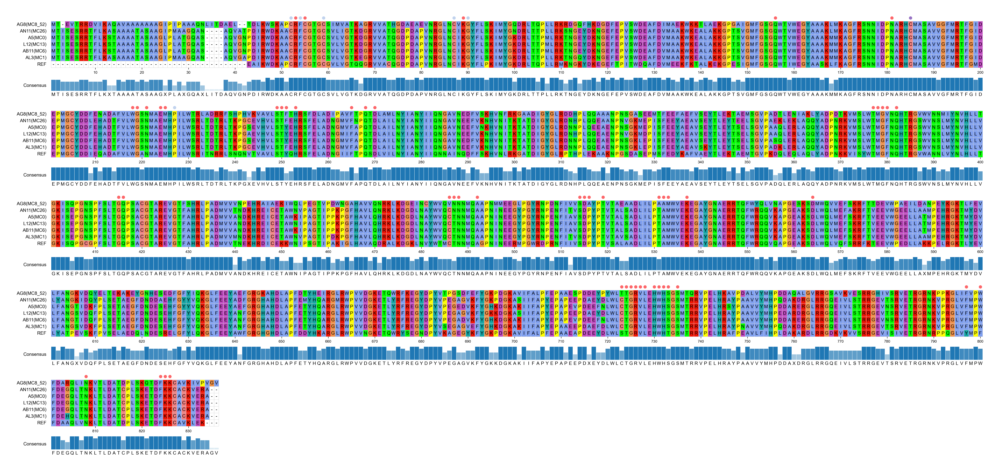

In [173]:
aln_seq = {_.id:str(_.seq) for _ in SeqIO.parse(pdbfile.replace('.pdb','.aln'),'fasta')}
longseq = aln_seq['REF']
oriseq = chain2aa['A']

ori_idx = 0
idx_ori2long = {}
for longidx,longaa in enumerate(longseq):
    if longaa!='-':
        idx_ori2long[ori_idx] = longidx
        ori_idx+=1
    # 0-coord
        
from pymsaviz import MsaViz, get_msa_testdata
#res2color = {'CYN':'#c1d3ee','DHE':'#fd676a','GOL':'#9773c4','HEC':'#b81b65'}
res2color = {'SF4':'#c1d3ee','MGD':'#fd676a','6MO':'#9773c4'}
mv = MsaViz(pdbfile.replace('.pdb','.aln'), wrap_length=200, show_consensus=True,show_grid=True,color_scheme='Clustal')

res2longpos = defaultdict(list)
for realpos,site_list in realpos2AC.items():
    for aa,ac in site_list:
        res = ac2des[ac].split(' ')[0]
        res2longpos[res].append(idx_ori2long[realpos])
                            
for res,pos_list in res2longpos.items():
    sub_pos_list = [_+1 for _ in pos_list]
    mv.add_markers(sub_pos_list, color=res2color[res], marker="o")
#mv.add_markers([30, (40, 50), 55], color="green", marker="+")
_ = mv.plotfig(dpi=300)

#"api_example03.png")

In [174]:
def eye_iden(highest,others,ref):
    if set([highest])==set(others) and highest!=ref:
        return 'Conservative in Ruegeria'
    elif set([highest])!=set(others):
        return 'Unique in MC13'
    elif set([highest])==set(others) and highest==ref:
        return 'Conservative in ALL'
    return 'others'
for res,longpos_list in res2longpos.items():
    for longpos in longpos_list:
        pos = longpos
        ref = aln_seq['REF'][pos]
        highest = aln_seq['L12(MC13)'][pos]
        others = [aln_seq['A5(MC0)'][pos],aln_seq['AN11(MC26)'][pos]]
        print(res,longpos,pos,highest,others,ref,eye_iden(highest,others,ref))

SF4 51 51 C ['C', 'C'] C Conservative in ALL
SF4 53 53 F ['F', 'F'] F Conservative in ALL
SF4 54 54 C ['C', 'C'] C Conservative in ALL
SF4 58 58 C ['C', 'C'] C Conservative in ALL
SF4 86 86 C ['C', 'C'] C Conservative in ALL
SF4 88 88 K ['K', 'K'] K Conservative in ALL
SF4 89 89 G ['G', 'G'] G Conservative in ALL
SF4 226 226 P ['P', 'P'] P Conservative in ALL
MGD 52 52 R ['R', 'R'] R Conservative in ALL
MGD 54 54 C ['C', 'C'] C Conservative in ALL
MGD 88 88 K ['K', 'K'] K Conservative in ALL
MGD 155 155 Q ['Q', 'Q'] Q Conservative in ALL
MGD 180 180 N ['N', 'N'] N Conservative in ALL
MGD 184 184 C ['C', 'C'] C Conservative in ALL
MGD 184 184 C ['C', 'C'] C Conservative in ALL
MGD 217 217 W ['W', 'W'] W Conservative in ALL
MGD 218 218 G ['G', 'G'] G Conservative in ALL
MGD 220 220 N ['N', 'N'] N Conservative in ALL
MGD 223 223 E ['E', 'E'] E Conservative in ALL
MGD 224 224 M ['M', 'M'] M Conservative in ALL
MGD 248 248 S ['S', 'S'] S Conservative in ALL
MGD 249 249 T ['T', 'T'] T Conser

# nosZ

In [109]:
from Bio import SeqIO
d3to1 = {'CYS': 'C', 'ASP': 'D', 'SER': 'S', 'GLN': 'Q', 'LYS': 'K',
'ILE': 'I', 'PRO': 'P', 'THR': 'T', 'PHE': 'F', 'ASN': 'N', 
'GLY': 'G', 'HIS': 'H', 'LEU': 'L', 'ARG': 'R', 'TRP': 'W', 
'ALA': 'A', 'VAL':'V', 'GLU': 'E', 'TYR': 'Y', 'MET': 'M'}


# Just an example input pdb
pdbfile = './1fwx_nosZ.pdb'


from collections import defaultdict
cs = open(pdbfile).read().split('\n')
site_cs = [_.strip() for _ in cs  if _.startswith('SITE ') ]
remark_cs = [_.strip() for _ in cs  if _.startswith('REMARK ') ]
rid_first = remark_cs.index('REMARK 800 SITE')
remark_cs = remark_cs[rid_first:]

atom_cs = [_.strip() for _ in cs  if _.startswith('ATOM ') ]


preac = ''
ac2des = {}
for row in remark_cs:
    if 'SITE_IDENTIFIER: ' in row:
        acname = row.split(' ')[-1]
        preac = acname
    if 'SITE_DESCRIPTION: ' in row:
        des = row.split('SITE_DESCRIPTION: ')[-1].split('BINDING SITE FOR RESIDUE ')[-1]
        ac2des[preac] = des
def is_num(v):
    try:
        int(v)
        return True
    except:
        return False

    

AC2site = defaultdict(list)
for row in site_cs:
    rows = [_ for _ in row.split(' ') if _]
    ACname = rows[2]
    #rows = rows[:
    aa = ''
    pos = 0
    chain = ''
    for v in rows[4:]:
        if v in d3to1:
            aa = v
        if v in ['A','B']:
            chain = v
        if is_num(v):
            pos = int(v)
            AC2site[ACname].append((chain,aa,pos))
        if (not is_num(v)) and is_num(v[1:]):
            chain = v[0]
            pos = int(v[1:])
            AC2site[ACname].append((chain,aa,pos))

In [124]:
target_chain = 'A'
site2AC = defaultdict(list)
for ac,site_list in AC2site.items():
    for chain,aa,pseudo_pos in site_list:
        if chain!=target_chain:
            continue
        site2AC[str(pseudo_pos)].append((aa,ac))

realpos2AC = defaultdict(list)
chain2aa = defaultdict(str)
pre = ''
_chain = target_chain
for row in atom_cs:
    rows = [_ for _ in row.split(' ') if _]
    aa = rows[3]
    chain = rows[4]
    if pre!=rows[5]:
        pre = rows[5]
        chain2aa[chain]+=d3to1[aa]
    if rows[5] in site2AC and chain == target_chain:
        real_pos = len(chain2aa[chain])-1 # 0-coord
        realpos2AC[real_pos] = site2AC[rows[5]]
    if chain!=_chain:
        idx = 0

geno2fa = {_.id:_ for _ in SeqIO.parse(f"./nosZ_isolates.faa",'fasta')}

with open(pdbfile.replace('.pdb','.fasta'),'w') as f1:
    #for k,v in chain2fasta.items():
    f1.write(f">chain {target_chain}\n{chain2aa[target_chain]}\n")
    for k,v in geno2fa.items():
        f1.write(f">{k}\n{str(v.seq)}\n")

In [125]:
cmd = f"mafft {pdbfile.replace('.pdb','.fasta')} > {pdbfile.replace('.pdb','.aln')}"
print(cmd)
os.system(cmd)

mafft ./1fwx_nosZ.fasta > ./1fwx_nosZ.aln


0

In [126]:
renamed_d = {'chain':'REF',
'AL3':'AL3(MC1)',
'AB11':'AB11(MC6)',
'L12':'L12(MC13)',
'A5':'A5(MC0)',
'AN11':'AN11(MC26)',
'B4':'B4(MC10)',
'AG8':'AG8(MC8_52)',}
a = list(SeqIO.parse(pdbfile.replace('.pdb','.aln'),'fasta'))
with open(pdbfile.replace('.pdb','.aln'),'w') as f1:
    for r in a:
        r.id = renamed_d.get(r.id,r.id)
    SeqIO.write(a[::-1],f1,'fasta-2line')

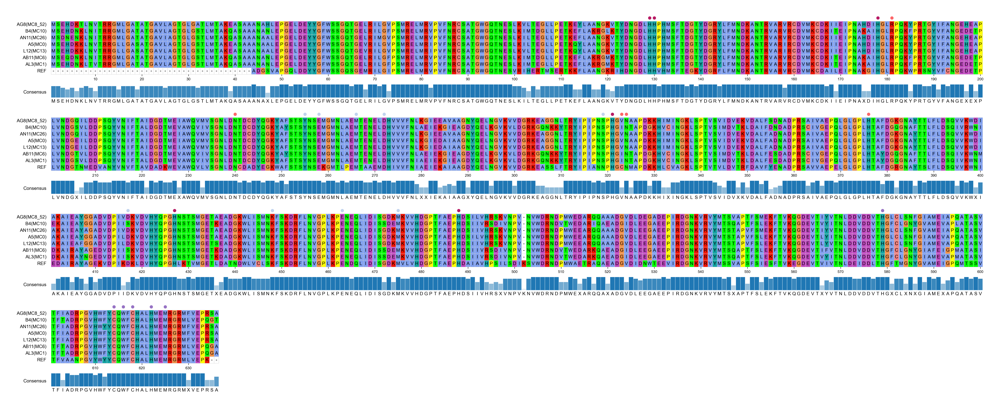

In [160]:
aln_seq = {_.id:str(_.seq) for _ in SeqIO.parse(pdbfile.replace('.pdb','.aln'),'fasta')}
longseq = aln_seq['REF']
oriseq = chain2aa['A']

ori_idx = 0
idx_ori2long = {}
for longidx,longaa in enumerate(longseq):
    if longaa!='-':
        idx_ori2long[ori_idx] = longidx
        ori_idx+=1
    # 0-coord
        
from pymsaviz import MsaViz, get_msa_testdata
#res2color = {'CYN':'#c1d3ee','DHE':'#fd676a','GOL':'#9773c4','HEC':'#b81b65'}
res2color = {'CA':'#c1d3ee','CL':'#fd676a','CUA':'#9773c4','CUZ':'#b81b65'}
mv = MsaViz(pdbfile.replace('.pdb','.aln'), wrap_length=200, show_consensus=True,show_grid=True,color_scheme='Clustal')

res2longpos = defaultdict(list)
for realpos,site_list in realpos2AC.items():
    for aa,ac in site_list:
        res = ac2des[ac].split(' ')[0]
        res2longpos[res].append(idx_ori2long[realpos])
                            
for res,pos_list in res2longpos.items():
    sub_pos_list = [_+1 for _ in pos_list]
    mv.add_markers(sub_pos_list, color=res2color[res], marker="o")
#mv.add_markers([30, (40, 50), 55], color="green", marker="+")
_ = mv.plotfig(dpi=300)

#"api_example03.png")

In [157]:
def eye_iden(highest,others,ref):
    if set([highest])==set(others) and highest!=ref:
        return 'Conservative in Ruegeria'
    elif set([highest])!=set(others):
        return 'Unique in MC13'
    elif set([highest])==set(others) and highest==ref:
        return 'Conservative in ALL'
    return 'others'
for res,longpos_list in res2longpos.items():
    for longpos in longpos_list:
        pos = longpos
        ref = aln_seq['REF'][pos]
        highest = aln_seq['L12(MC13)'][pos]
        others = [aln_seq['A5(MC0)'][pos],aln_seq['AN11(MC26)'][pos]]
        print(res,longpos,pos,highest,others,ref,eye_iden(highest,others,ref))

CUZ 128 128 H ['H', 'H'] H Conservative in ALL
CUZ 129 129 H ['H', 'H'] H Conservative in ALL
CUZ 177 177 H ['H', 'H'] H Conservative in ALL
CUZ 320 320 H ['H', 'H'] H Conservative in ALL
CUZ 375 375 H ['H', 'H'] H Conservative in ALL
CUZ 426 426 H ['H', 'H'] H Conservative in ALL
CUZ 487 487 H ['H', 'H'] H Conservative in ALL
CL 180 180 R ['R', 'R'] R Conservative in ALL
CL 239 239 N ['N', 'N'] N Conservative in ALL
CL 322 322 V ['V', 'V'] C Conservative in Ruegeria
CL 323 323 N ['N', 'N'] N Conservative in ALL
CL 375 375 H ['H', 'H'] H Conservative in ALL
CA 254 254 Y ['Y', 'Y'] Y Conservative in ALL
CA 257 257 E ['E', 'E'] E Conservative in ALL
CA 265 265 M ['M', 'M'] M Conservative in ALL
CA 271 271 D ['D', 'D'] D Conservative in ALL
CA 318 318 S ['S', 'S'] N Conservative in Ruegeria
CA 416 416 D ['D', 'D'] D Conservative in ALL
CA 447 447 K ['K', 'K'] K Conservative in ALL
CA 462 462 E ['E', 'E'] E Conservative in ALL
CA 474 474 M ['M', 'M'] M Conservative in ALL
CUA 578 578 H ['H

# norBC

In [170]:

from Bio import SeqIO
d3to1 = {'CYS': 'C', 'ASP': 'D', 'SER': 'S', 'GLN': 'Q', 'LYS': 'K',
'ILE': 'I', 'PRO': 'P', 'THR': 'T', 'PHE': 'F', 'ASN': 'N', 
'GLY': 'G', 'HIS': 'H', 'LEU': 'L', 'ARG': 'R', 'TRP': 'W', 
'ALA': 'A', 'VAL':'V', 'GLU': 'E', 'TYR': 'Y', 'MET': 'M'}


# Just an example input pdb
pdbfile = './5GUW_norBC.pdb'


from collections import defaultdict
cs = open(pdbfile).read().split('\n')
site_cs = [_.strip() for _ in cs  if _.startswith('SITE ') ]
remark_cs = [_.strip() for _ in cs  if _.startswith('REMARK ') ]
rid_first = remark_cs.index('REMARK 800 SITE')
remark_cs = remark_cs[rid_first:]

atom_cs = [_.strip() for _ in cs  if _.startswith('ATOM ') ]


preac = ''
ac2des = {}
for row in remark_cs:
    if 'SITE_IDENTIFIER: ' in row:
        acname = row.split(' ')[-1]
        preac = acname
    if 'Di-peptide' in row:
        continue
    if 'SITE_DESCRIPTION: ' in row:
        des = row.split('SITE_DESCRIPTION: ')[-1].split('BINDING SITE FOR RESIDUE ')[-1]
        des = des.split('binding site for residue ')[-1]
        ac2des[preac] = des
    
def is_num(v):
    try:
        int(v)
        return True
    except:
        return False

    

AC2site = defaultdict(list)
for row in site_cs:
    rows = [_ for _ in row.split(' ') if _]
    ACname = rows[2]
    #rows = rows[:
    aa = ''
    pos = 0
    chain = ''
    for v in rows[4:]:
        if v in d3to1:
            aa = v
        if v in ['A','B']:
            chain = v
        if is_num(v):
            pos = int(v)
            AC2site[ACname].append((chain,aa,pos))
        if (not is_num(v)) and is_num(v[1:]):
            chain = v[0]
            pos = int(v[1:])
            AC2site[ACname].append((chain,aa,pos))
            

In [165]:
target_chain = 'B'
site2AC = defaultdict(list)
for ac,site_list in AC2site.items():
    for chain,aa,pseudo_pos in site_list:
        if chain!=target_chain:
            continue
        site2AC[str(pseudo_pos)].append((aa,ac))

realpos2AC = defaultdict(list)
chain2aa = defaultdict(str)
pre = ''
_chain = target_chain
for row in atom_cs:
    rows = [_ for _ in row.split(' ') if _]
    aa = rows[3]
    chain = rows[4]
    if pre!=rows[5]:
        pre = rows[5]
        chain2aa[chain]+=d3to1[aa]
    if rows[5] in site2AC and chain == target_chain:
        real_pos = len(chain2aa[chain])-1 # 0-coord
        realpos2AC[real_pos] = site2AC[rows[5]]
    if chain!=_chain:
        idx = 0

geno2fa = {_.id:_ for _ in SeqIO.parse(f"./norB_isolates.faa",'fasta')}

with open(pdbfile.replace('.pdb','.fasta'),'w') as f1:
    #for k,v in chain2fasta.items():
    f1.write(f">chain {target_chain}\n{chain2aa[target_chain]}\n")
    for k,v in geno2fa.items():
        f1.write(f">{k}\n{str(v.seq)}\n")

In [166]:
cmd = f"mafft {pdbfile.replace('.pdb','.fasta')} > {pdbfile.replace('.pdb','.aln')}"
print(cmd)
os.system(cmd)

mafft ./5GUW_norBC.fasta > ./5GUW_norBC.aln


0

In [167]:
renamed_d = {'chain':'REF',
'AL3':'AL3(MC1)',
'AB11':'AB11(MC6)',
'L12':'L12(MC13)',
'A5':'A5(MC0)',
'AN11':'AN11(MC26)',
'B4':'B4(MC10)',
'AG8':'AG8(MC8_52)',}
a = list(SeqIO.parse(pdbfile.replace('.pdb','.aln'),'fasta'))
with open(pdbfile.replace('.pdb','.aln'),'w') as f1:
    for r in a:
        r.id = renamed_d.get(r.id,r.id)
    SeqIO.write(a[::-1],f1,'fasta-2line')

In [172]:
import plotly.express as px
dict(zip(set([v.split(' ')[0] for v in ac2des.values() if not 'Di-peptide' in v]),px.colors.qualitative.Dark24))

{'O': '#2E91E5',
 'HEM': '#E15F99',
 '10M': '#1CA71C',
 'FE': '#FB0D0D',
 'CL': '#DA16FF',
 'CA': '#222A2A',
 'HEC': '#B68100',
 'DHE': '#750D86'}

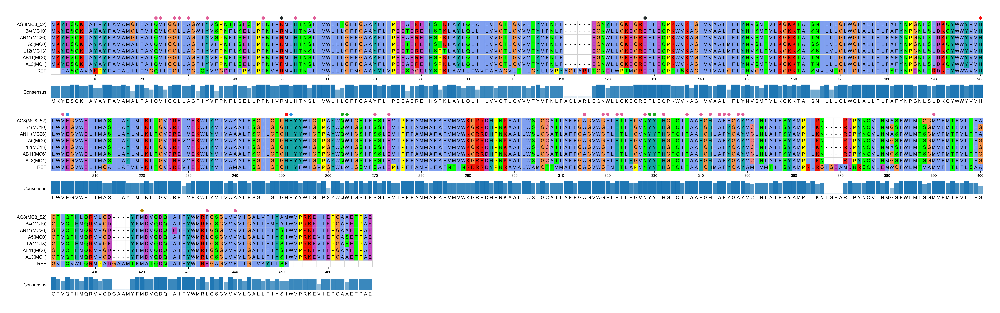

In [173]:
aln_seq = {_.id:str(_.seq) for _ in SeqIO.parse(pdbfile.replace('.pdb','.aln'),'fasta')}
longseq = aln_seq['REF']
oriseq = chain2aa[target_chain]

ori_idx = 0
idx_ori2long = {}
for longidx,longaa in enumerate(longseq):
    if longaa!='-':
        idx_ori2long[ori_idx] = longidx
        ori_idx+=1
    # 0-coord
        
from pymsaviz import MsaViz, get_msa_testdata
#res2color = {'CYN':'#c1d3ee','DHE':'#fd676a','GOL':'#9773c4','HEC':'#b81b65'}
res2color = {'O': '#2E91E5',
 'HEM': '#E15F99',
 '10M': '#1CA71C',
 'FE': '#FB0D0D',
 'CL': '#DA16FF',
 'CA': '#222A2A',
 'HEC': '#B68100',
 'DHE': '#750D86'}
mv = MsaViz(pdbfile.replace('.pdb','.aln'), wrap_length=200, show_consensus=True,show_grid=True,color_scheme='Clustal')

res2longpos = defaultdict(list)
for realpos,site_list in realpos2AC.items():
    for aa,ac in site_list:
        res = ac2des[ac].split(' ')[0]
        res2longpos[res].append(idx_ori2long[realpos])
                            
for res,pos_list in res2longpos.items():
    sub_pos_list = [_+1 for _ in pos_list]
    mv.add_markers(sub_pos_list, color=res2color[res], marker="o")
#mv.add_markers([30, (40, 50), 55], color="green", marker="+")
_ = mv.plotfig(dpi=300)

#"api_example03.png")

In [174]:
def eye_iden(highest,others,ref):
    if set([highest])==set(others) and highest!=ref:
        return 'Conservative in Ruegeria'
    elif set([highest])!=set(others):
        return 'Unique in MC13'
    elif set([highest])==set(others) and highest==ref:
        return 'Conservative in ALL'
    return 'others'
for res,longpos_list in res2longpos.items():
    for longpos in longpos_list:
        pos = longpos
        ref = aln_seq['REF'][pos]
        highest = aln_seq['L12(MC13)'][pos]
        others = [aln_seq['A5(MC0)'][pos],aln_seq['AN11(MC26)'][pos]]
        print(res,longpos,pos,highest,others,ref,eye_iden(highest,others,ref))

HEM 22 22 Q ['Q', 'Q'] Q Conservative in ALL
HEM 23 23 V ['V', 'V'] I Conservative in Ruegeria
HEM 26 26 G ['G', 'G'] G Conservative in ALL
HEM 27 27 L ['L', 'L'] L Conservative in ALL
HEM 29 29 A ['A', 'A'] M Conservative in Ruegeria
HEM 33 33 Y ['Y', 'Y'] Y Conservative in ALL
HEM 45 45 F ['F', 'F'] F Conservative in ALL
HEM 49 49 R ['R', 'R'] R Conservative in ALL
HEM 52 52 H ['H', 'H'] H Conservative in ALL
HEM 56 56 L ['L', 'L'] L Conservative in ALL
HEM 127 127 E ['E', 'E'] E Conservative in ALL
HEM 127 127 E ['E', 'E'] E Conservative in ALL
HEM 202 202 V ['V', 'V'] V Conservative in ALL
HEM 203 203 E ['E', 'E'] E Conservative in ALL
HEM 250 250 H ['H', 'H'] H Conservative in ALL
HEM 251 251 H ['H', 'H'] H Conservative in ALL
HEM 269 269 S ['S', 'S'] S Conservative in ALL
HEM 272 272 E ['E', 'E'] E Conservative in ALL
HEM 314 314 A ['A', 'A'] A Conservative in ALL
HEM 318 318 G ['G', 'G'] G Conservative in ALL
HEM 319 319 F ['F', 'F'] F Conservative in ALL
HEM 321 321 H ['H', 'H'

# nirS

In [180]:

from Bio import SeqIO
d3to1 = {'CYS': 'C', 'ASP': 'D', 'SER': 'S', 'GLN': 'Q', 'LYS': 'K',
'ILE': 'I', 'PRO': 'P', 'THR': 'T', 'PHE': 'F', 'ASN': 'N', 
'GLY': 'G', 'HIS': 'H', 'LEU': 'L', 'ARG': 'R', 'TRP': 'W', 
'ALA': 'A', 'VAL':'V', 'GLU': 'E', 'TYR': 'Y', 'MET': 'M'}


# Just an example input pdb
pdbfile = './1e2r_nirS.pdb'


from collections import defaultdict
cs = open(pdbfile).read().split('\n')
site_cs = [_.strip() for _ in cs  if _.startswith('SITE ') ]
remark_cs = [_.strip() for _ in cs  if _.startswith('REMARK ') ]
rid_first = remark_cs.index('REMARK 800 SITE')
remark_cs = remark_cs[rid_first:]

atom_cs = [_.strip() for _ in cs  if _.startswith('ATOM ') ]


preac = ''
ac2des = {}
for row in remark_cs:
    if 'SITE_IDENTIFIER: ' in row:
        acname = row.split(' ')[-1]
        preac = acname
    if 'Di-peptide' in row:
        continue
    if 'SITE_DESCRIPTION: ' in row:
        des = row.split('SITE_DESCRIPTION: ')[-1].split('BINDING SITE FOR RESIDUE ')[-1]
        des = des.split('binding site for residue ')[-1]
        ac2des[preac] = des
    
def is_num(v):
    try:
        int(v)
        return True
    except:
        return False

    

AC2site = defaultdict(list)
for row in site_cs:
    rows = [_ for _ in row.split(' ') if _]
    ACname = rows[2]
    #rows = rows[:
    aa = ''
    pos = 0
    chain = ''
    for v in rows[4:]:
        if v in d3to1:
            aa = v
        if v in ['A','B']:
            chain = v
        if is_num(v):
            pos = int(v)
            AC2site[ACname].append((chain,aa,pos))
        if (not is_num(v)) and is_num(v[1:]):
            chain = v[0]
            pos = int(v[1:])
            AC2site[ACname].append((chain,aa,pos))
            

target_chain = 'A'
site2AC = defaultdict(list)
for ac,site_list in AC2site.items():
    for chain,aa,pseudo_pos in site_list:
        if chain!=target_chain:
            continue
        site2AC[str(pseudo_pos)].append((aa,ac))

realpos2AC = defaultdict(list)
chain2aa = defaultdict(str)
pre = ''
_chain = target_chain
for row in atom_cs:
    rows = [_ for _ in row.split(' ') if _]
    aa = rows[3]
    chain = rows[4]
    if pre!=rows[5]:
        pre = rows[5]
        chain2aa[chain]+=d3to1[aa]
    if rows[5] in site2AC and chain == target_chain:
        real_pos = len(chain2aa[chain])-1 # 0-coord
        realpos2AC[real_pos] = site2AC[rows[5]]
    if chain!=_chain:
        idx = 0

geno2fa = {_.id:_ for _ in SeqIO.parse(f"./nirS_isolates.faa",'fasta')}

with open(pdbfile.replace('.pdb','.fasta'),'w') as f1:
    #for k,v in chain2fasta.items():
    f1.write(f">chain {target_chain}\n{chain2aa[target_chain]}\n")
    for k,v in geno2fa.items():
        f1.write(f">{k}\n{str(v.seq)}\n")

In [181]:
cmd = f"mafft {pdbfile.replace('.pdb','.fasta')} > {pdbfile.replace('.pdb','.aln')}"
print(cmd)
os.system(cmd)

mafft ./1e2r_nirS.fasta > ./1e2r_nirS.aln


0

In [190]:
renamed_d = {'chain':'REF',
'AL3':'AL3(MC1)',
'AB11':'AB11(MC6)',
'L12':'L12(MC13)',
'A5':'A5(MC0)',
'AN11':'AN11(MC26)',
'B4':'B4(MC10)',
'AG8':'AG8(MC8_52)',}
a = list(SeqIO.parse(pdbfile.replace('.pdb','.aln'),'fasta'))
with open(pdbfile.replace('.pdb','.aln'),'w') as f1:
    for r in a:
        r.id = renamed_d.get(r.id,r.id)
    SeqIO.write(a[::-1],f1,'fasta-2line')

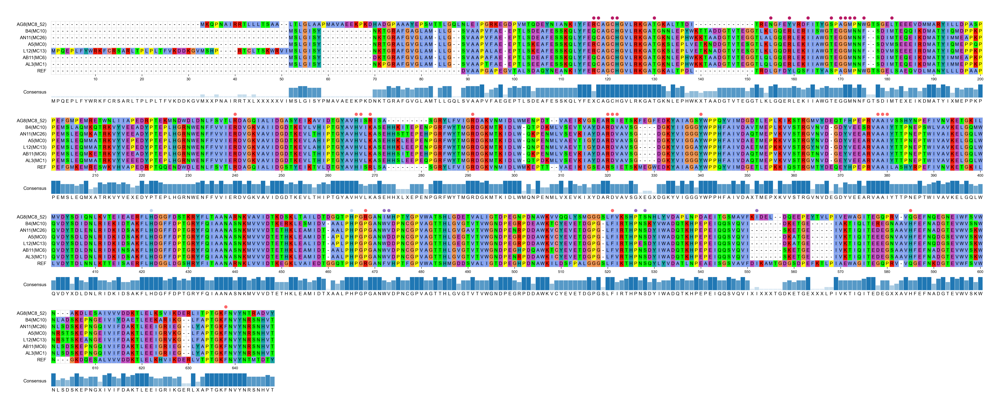

In [191]:
aln_seq = {_.id:str(_.seq) for _ in SeqIO.parse(pdbfile.replace('.pdb','.aln'),'fasta')}
longseq = aln_seq['REF']
oriseq = chain2aa[target_chain]

ori_idx = 0
idx_ori2long = {}
for longidx,longaa in enumerate(longseq):
    if longaa!='-':
        idx_ori2long[ori_idx] = longidx
        ori_idx+=1
    # 0-coord
        
from pymsaviz import MsaViz, get_msa_testdata
#res2color = {'CYN':'#c1d3ee','DHE':'#fd676a','GOL':'#9773c4','HEC':'#b81b65'}
res2color = {'CYN':'#c1d3ee','DHE':'#fd676a','GOL':'#9773c4','HEC':'#b81b65'}
mv = MsaViz(pdbfile.replace('.pdb','.aln'), wrap_length=200, show_consensus=True,show_grid=True,color_scheme='Clustal')

res2longpos = defaultdict(list)
for realpos,site_list in realpos2AC.items():
    for aa,ac in site_list:
        res = ac2des[ac].split(' ')[0]
        res2longpos[res].append(idx_ori2long[realpos])
                            
for res,pos_list in res2longpos.items():
    sub_pos_list = [_+1 for _ in pos_list]
    mv.add_markers(sub_pos_list, color=res2color[res], marker="o")
#mv.add_markers([30, (40, 50), 55], color="green", marker="+")
_ = mv.plotfig(dpi=300)

#"api_example03.png")

In [189]:
def eye_iden(highest,others,ref):
    if set([highest])==set(others) and highest!=ref:
        return 'Conservative in Ruegeria'
    elif set([highest])!=set(others):
        return 'Unique in MC13'
    elif set([highest])==set(others) and highest==ref:
        return 'Conservative in ALL'
    return 'others'
for res,longpos_list in res2longpos.items():
    for longpos in longpos_list:
        pos = longpos
        ref = aln_seq['REF'][pos]
        highest = aln_seq['L12(MC13)'][pos]
        others = [aln_seq['A5(MC0)'][pos],aln_seq['AN11(MC26)'][pos]]
        print(res,longpos,pos,highest,others,ref,eye_iden(highest,others,ref))

HEC 116 116 R ['R', 'Q'] R Unique in MC13
HEC 117 117 C ['C', 'C'] C Conservative in ALL
HEC 120 120 C ['C', 'C'] C Conservative in ALL
HEC 121 121 H ['H', 'H'] H Conservative in ALL
HEC 129 129 T ['T', 'T'] T Conservative in ALL
HEC 154 154 L ['L', 'L'] L Conservative in ALL
HEC 158 158 R ['R', 'R'] Y Conservative in Ruegeria
HEC 162 162 I ['I', 'I'] F Conservative in Ruegeria
HEC 167 167 T ['T', 'T'] S Conservative in Ruegeria
HEC 169 169 G ['G', 'G'] A Conservative in Ruegeria
HEC 170 170 G ['G', 'G'] G Conservative in ALL
HEC 171 171 M ['M', 'M'] M Conservative in ALL
HEC 172 172 N ['N', 'N'] P Conservative in Ruegeria
HEC 174 174 F ['F', 'F'] W Conservative in Ruegeria
HEC 180 180 M ['M', 'M'] L Conservative in Ruegeria
DHE 239 239 R ['R', 'R'] R Conservative in ALL
DHE 265 265 H ['H', 'H'] H Conservative in ALL
DHE 266 266 V ['V', 'V'] I Conservative in Ruegeria
DHE 268 268 K ['K', 'K'] R Conservative in Ruegeria
DHE 290 290 R ['R', 'R'] R Conservative in ALL
DHE 319 319 R ['R', 

# genomic comparison analysis

In [2]:
from os.path import *
import pandas as pd
from Bio import SeqIO
from glob import glob
# from api_tools.pop.tk import parse_maf,write_block,concat_block_aln
from collections import *
from tqdm import tqdm
from api_tools.itol_func import to_binary_shape

ko_info = pd.read_csv(
    '/home-user/thliao/db/protein_db/kegg/v20230301/link/ko2name.list', sep='\t', index_col=0)
ko2info = {ko: i for ko, i in ko_info['definition'].to_dict().items()}
ko2gene = {ko: i for ko, i in ko_info['gene'].to_dict().items()}
ko2module = pd.read_csv('/mnt/home-db/pub/protein_db/kegg/v20230301/link/ko2module',sep='\t',index_col=0)
ko2module.index= [_.replace('ko:','') for _ in ko2module.index]
ko2module = ko2module.loc[:,['module name']]

ko2modules = defaultdict(list)
for ko,m in ko2module['module name'].to_dict().items():
    ko2modules[ko].append(m)
ko2modules = {k:';'.join(sorted(list(set(v)))) for k,v in ko2modules.items()}

ko2pathway = pd.read_csv('/mnt/home-db/pub/protein_db/kegg/v20230301/link/ko2pathway',sep='\t',index_col=0)
ko2pathway.index= [_.replace('ko:','') for _ in ko2pathway.index]
ko2pathway = ko2pathway.loc[:,['Name']]

ko2pathways = defaultdict(list)
for ko,m in ko2pathway['Name'].to_dict().items():
    ko2pathways[ko].append(m)
ko2pathways = {k:';'.join(sorted(list(set([str(_) for _ in v])))) for k,v in ko2pathways.items()}

g2file = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/2305_files.tsv',sep='\t',index_col=0)



In [3]:

g2pop = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/2305Ruegeria_MCs.tsv',sep='\t',index_col=0)
g2pop = g2pop['MC'].to_dict()
pop2g = defaultdict(list)
for g,pop in g2pop.items():
    pop2g[pop].append(g)
    


og_df = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/data_processing/of_out20230527/of_full/Results_Jun04/Orthogroups/Orthogroups.tsv',sep='\t',index_col=0)
pop2g = {k:[_ for _ in v if _ in og_df.columns] for k,v in pop2g.items() }
pop2g = {k:v for k,v in pop2g.items() if len(v)!=0}


anno_file = "/mnt/ivy/thliao/project/coral_ruegeria/data_processing/annotations/KEGG_latest//kegg_anno.tsv"
kegg_df = pd.read_csv(anno_file, sep='\t', index_col=0, low_memory=False)

/home-user/thliao/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3417: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,24

In [4]:
genome_xs = 'AN11;BF4;BF6;BF11;AI2;L12;AL3;N8;O11;D5;J9;AH2;H8;J8;AF10;J12;AB6;AA3;AD11;A5;H3;AG7;AE12;H1;AA5;BJ7;AP8;AD5;K7'

In [ ]:
subog_df = og_df.reindex(columns=genome_xs.split(';'))

In [9]:

og_df = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/data_processing/of_out20230527/of_full/Results_Jun04/Orthogroups/Orthogroups.tsv',sep='\t',index_col=0)
pop2g = {k:[_ for _ in v if _ in og_df.columns] for k,v in pop2g.items() }
pop2g = {k:v for k,v in pop2g.items() if len(v)!=0}



locus2ko = {locus: ko
            for ko, _d in kegg_df.to_dict().items()
            for genome, locus_list in _d.items()
            for locus in str(locus_list).split(',')}
locus2og = {locus: OG
            for OG, _d in og_df.to_dict().items()
            for genome, locus_list in _d.items()
            for locus in str(locus_list).split(',')}
og2ko = defaultdict(list)
for l, k in tqdm(locus2ko.items()):
    if l in locus2og:
        og2ko[locus2og[l]].append(k)
og2ko_f = {og: sorted(ko, key=lambda x: Counter(ko)[x])[-1] for og, ko in og2ko.items()}
ko_info = pd.read_csv(
    '/home-user/thliao/db/protein_db/kegg/v20230301/ko_list', sep='\t', index_col=0)
ko2info = {ko: i for ko, i in ko_info['definition'].to_dict().items()}
# with open(f'/mnt/ivy/thliao/project/coral_ruegeria/data_processing/of_out20230527/of_full/Results_Jun04/Orthogroups/OG2KEGG.tsv', 'w') as f1:
#     f1.write("OG\tKO\tdescription\n")
#     for og, ko in og2ko_f.items():
#         f1.write(f"{og}\t{ko}\t{ko2info.get(ko,'')}\n")

/home-user/thliao/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3417: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,24

In [201]:

og2kegg_df = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/data_processing/of_out20230527/of_full/Results_Jun04/Orthogroups/OG2KEGG.tsv',sep='\t',index_col=0)

og_df = og_df.T
num_df = og_df.fillna('').applymap(lambda x: 0 if x=='' else len(x.split(',')))

from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm

In [208]:
gids = [_.id.split('(')[0] for _ in a][1:]

In [ ]:
subogdf = og_df.loc[gids,:]
subogdf.loc[:,~subogdf.isna().all(0)]

 

In [228]:
og2kegg_df.loc[:,'module'] = [ko2modules.get(ko,'') for ko in og2kegg_df['KO']]
og2kegg_df.loc[:,'pathways'] = [ko2pathways.get(ko,'') for ko in og2kegg_df['KO']]

In [230]:
## L12 MC13 have, but not in A5 or AN11
og_list = subogdf.columns[(~subogdf.loc['L12',:].isna()) & (subogdf.loc[['A5','AN11'],:].isna().all())]
og2kegg_df.loc[[_ for _ in og_list if _ in og2kegg_df.index],:].to_excel('./test.xlsx')

In [239]:
subogdf.loc[['A5','AN11','L12'],'OG0005825']

A5            NaN
AN11          NaN
L12     L12_03622
Name: OG0005825, dtype: object

In [240]:
subogdf.loc[['A5','AN11','L12'],'OG0005687']

A5            NaN
AN11          NaN
L12     L12_03623
Name: OG0005687, dtype: object

In [237]:
kegg_df.loc[subogdf.index,'K15577']

AL3            NaN
AB11           NaN
L12      L12_04133
A5        A5_02809
AN11    AN11_01925
B4             NaN
AG8      AG8_00137
Name: K15577, dtype: object

In [249]:
kegg_df.loc[subogdf.index,'K07322']

AL3           NaN
AB11          NaN
L12     L12_03537
A5            NaN
AN11          NaN
B4            NaN
AG8           NaN
Name: K07322, dtype: object

In [89]:
kegg_df.loc['AE12','K07322']

'AE12_03404'

In [178]:
gids = ['AL3', 'AB11', 'L12', 'A5', 'AN11', 'B4', 'AG8']

In [ ]:
ko_list = kegg_df.columns[(kegg_df.loc['L12',:].isna()) & ((~kegg_df.loc[['A5','AN11','BG7'],:].isna()).all())]
print(len(ko_list))
for ko in ko_list:
    print(ko,ko2gene[ko],ko2info[ko])

In [183]:

ko_list = kegg_df.columns[(~kegg_df.loc['L12',:].isna()) & (kegg_df.loc[['A5','AN11','BG7'],:].isna().all())]
print(len(ko_list))
for ko in ko_list:
    print(ko,';',ko2gene[ko],ko2info[ko])
with open('./diff_kos.tsv','w') as f1:
    f1.write(f"KO\tdescription\t" + '\t'.join([f"{g}(g2pop[g])" for g in ['L12','A5','AN11','BG7']])+'\n')

44
K17218 ; sqr sulfide:quinone oxidoreductase [EC:1.8.5.4]
K12941 ; abgB aminobenzoyl-glutamate utilization protein B
K03282 ; mscL large conductance mechanosensitive channel
K03651 ; cpdA 3',5'-cyclic-AMP phosphodiesterase [EC:3.1.4.53]
K16841 ; hpxA allantoin racemase [EC:5.1.99.3]
K02421 ; fliR flagellar biosynthesis protein FliR
K02026 ; ABC.MS.P1 multiple sugar transport system permease protein
K02027 ; ABC.MS.S multiple sugar transport system substrate-binding protein
K24845 ; ubiV O2-independent ubiquinone biosynthesis protein UbiV
K24844 ; ubiU O2-independent ubiquinone biosynthesis protein UbiU
K24843 ; ubiT O2-independent ubiquinone biosynthesis accessory factor UbiT
K09144 ; K09144 uncharacterized protein
K06867 ; K06867 uncharacterized protein
K02077 ; ABC.ZM.S zinc/manganese transport system substrate-binding protein
K07336 ; K07336 PKHD-type hydroxylase [EC:1.14.11.-]
K02474 ; wbpO UDP-N-acetyl-D-glucosamine/UDP-N-acetyl-D-galactosamine dehydrogenase [EC:1.1.1.136 1.1.1.

# compare denitrification genes region

In [139]:
import pandas as pd
from collections import defaultdict
g2pop = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/2305Ruegeria_MCs.tsv',sep='\t',index_col=0)
g2pop = g2pop['MC'].to_dict()
pop2g = defaultdict(list)
for g,pop in g2pop.items():
    pop2g[pop].append(g)
    

In [66]:
def parse_gbk(gbk_file):
    info = {}
    records = list(SeqIO.parse(gbk_file, 'genbank'))
    for contig in records:
        all_fea = [_ for _ in contig.features if 'locus_tag' in _.qualifiers]
        for fea in all_fea:
            locus_tag = fea.qualifiers['locus_tag'][0].split(':')[-1]
            #protein_name = fea.qualifiers.get('gene'][0]
            start = fea.location.start.real
            end = fea.location.end.real
            strand = fea.location.strand
            contig_name = contig.id
            info[locus_tag] = [contig_name, start, end, strand]
    return info

In [94]:
genome = 'AH2'
gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/inproteins/{genome}.faa'
_gbk = realpath(gbk).replace('.faa','.gbk')
pinfo = parse_gbk(_gbk)    
pinfo['AH2_01656']

['contig00003', 407094, 409158, 1]

In [ ]:
from Bio import SeqIO

# MC1-AL3, MC6-AE12, MC13-L12-has Nanopore), non-specialist (MC0-A5, MC15-BG7, MC26 -AN11
info = [('AL3','AL3_2',762531-flanking,797615+flanking,-1),
        ('AE12','contig00004',247503-flanking,279674+flanking,1),
        ('L12','L12_1',64533-flanking,67427+flanking,1),
        ('A5','A5_1',258900-flanking,296240+flanking,1),
        ('BG7','contig00001',2027593-flanking,296240+flanking,1),
        ('AN11','AN11_2',855691-flanking,889612+flanking,-1),]
for genome,contig,start,end,DIRECTION in info:
    gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/inproteins/{genome}.faa'
    _gbk = {_.id:_ for _ in SeqIO.parse(realpath(gbk).replace('.faa','.gbk'),'genbank')}
    _region = _gbk[contig][start:end]
    if DIRECTION ==-1:
        _region = _region.reverse_complement(id=_region.id,name=_region.name)
        _region.annotations['molecule_type'] =  'DNA'
    with open(f'./{genome}_denitrification.fna','w') as f1:
        SeqIO.write(_region,f1,'fasta-2line')
    print(genome,len(_region.seq))
    with open(f'./{genome}_denitrification.gbk','w') as f1:
        SeqIO.write(_region,f1,'genbank')
        
_gbk = {_.id:_ for _ in SeqIO.parse(f'Paradenitri.gbk','genbank')}

In [160]:
genomes = [genome for genome,contig,start,end,DIRECTION in info]

genome2df = {}
for g in tqdm(genomes):
    d = pd.read_excel(f'/mnt/ivy/thliao/project/coral_ruegeria/nanopore_processing/annotations/summarized_tables/{g2pop[g]}_{g}.xlsx')
    locus2name = {}
    for idx,row in d.iterrows():
        name = row['KEGG gene']
        if name=='NA' or str(name).startswith('K'):
            if 'related genes (COG)' in d.columns:
                name = row['related genes (COG)']
            else:
                name = row['related genes']
        if name =='NA':
            name = ''
        locus2name[row['locus tag']] = name
    genome2df[g] = locus2name

100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


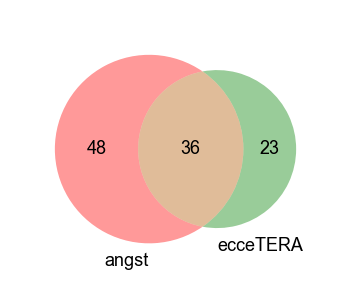

In [210]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
a = open('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/AncestralReconstruction/angst_OG.list').read().strip().split('\n')
b = open('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/AncestralReconstruction/ecceTERA_OG.list').read().strip().split('\n')

plt.figure(figsize=(5,5))
venn  = venn2(subsets = (set(a),set(b)), set_labels = ('angst', 'ecceTERA'),)
for label in venn.set_labels:
    if label:
        label.set_fontsize(18)  # 修改集合标签字体大小

# 调整数字字体大小
for label in venn.subset_labels:
    if label:
        label.set_fontsize(18)  # 修改数量字体大小
plt.show()

In [9]:
# info = [('AN11', 'AN11_1', 2523894, 2565016, -1),
#  ('BF4', 'contig00006', 149137, 190256, -1),
#  ('BF6', 'contig00005', 86139, 127258, -1),
#  ('BF11', 'contig00004', 199189, 240308, 1),
#  ('AI2', 'contig00006', 72768, 113887, -1),
#  ('L12', 'contig00011', 14701, 55820, 1),
#  ('AL3', 'AL3_1', 906066, 947185, -1),
#  ('N8', 'contig00004', 50493, 91615, -1),
#  ('O11', 'contig00012', 69457, 110576, -1),
#  ('D5', 'contig00001', 394198, 435317, -1),
#  ('J9', 'contig00014', 9322, 50441, 1),
#  ('AH2', 'contig00012', 23764, 64889, 1),
#  ('H8', 'contig00007', 31845, 72964, 1),
#  ('J8', 'contig00006', 226025, 267144, 1),
#  ('AF10', 'contig00003', 87086, 128205, -1),
#  ('J12', 'contig00011', 70457, 111576, -1),
#  ('AB6', 'contig00006', 100990, 142109, 1),
#  ('AA3', 'contig00014', 52171, 93290, -1),
#  ('AD11', 'contig00015', 14376, 55495, 1),
#  ('A5', 'contig00011', 19226, 60345, 1),
#  ('H3', 'contig00011', 25696, 66815, 1),
#  ('AG7', 'contig00013', 47776, 88898, 1),
#  ('AE12', 'contig00018', 18832, 59951, 1),
#  ('H1', 'contig00013', 23858, 64983, 1),
#  ('AA5', 'contig00007', 13798, 54917, 1),
#  ('BJ7', 'contig00009', 19407, 60532, 1),
#  ('AP8', 'contig00003', 87086, 128205, -1),
#  ('AD5', 'contig00003', 10592, 51711, 1),
#  ('K7', 'contig00016', 59964, 101083, 1)]

In [145]:
spe2locus = {#'N8':'N8_02376',
             #'AH2':'AH2_01656',
             #'H1':'H1_01291',
             #'H3':'H3_02885'
            }

genome_xs = 'A5;AD5;BJ7;BF11;H8;AH2;H1;H3;AA5;AB6;J8;N8;AN11;D5;K7;AI2;AG7;AF10;AL3;AP8;J12;J9;L12;AD11;BF4;BF6;AA3;AE12;O11'.split(';')

flanking = 30000

genome2locus = subog_df.loc[:,'OG0002916'].to_dict()
info = []
for genome in tqdm(genome_xs):
    if genome not in 'AH2,H1,H3,N8'.split(','):
        
        locus = genome2locus[genome]
    elif genome in spe2locus:
        locus = spe2locus[genome]
    else:
        print(genome)
        continue  
    gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/inproteins/{genome}.faa'
    _gbk = realpath(gbk).replace('.faa','.gbk')
    pinfo = parse_gbk(_gbk)    
    if str(locus)=='nan':
        print(genome)
        continue    
    contig_name, start, end, strand = pinfo[locus]
    info.append((genome,contig_name,start-flanking,end+flanking,strand))
for genome,contig,start,end,DIRECTION in info:
    gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/inproteins/{genome}.faa'
    _gbk = {_.id:_ for _ in SeqIO.parse(realpath(gbk).replace('.faa','.gbk'),'genbank')}
    if start <=0:
        start = 0
    if end >= len(_gbk[contig].seq):
        end = len(_gbk[contig].seq)
    _region = _gbk[contig][start:end]
    if DIRECTION ==-1:
        _region = _region.reverse_complement(id=_region.id,name=_region.name)
        _region.annotations['molecule_type'] =  'DNA'
    with open(f'./{genome}_denitrification.fna','w') as f1:
        SeqIO.write(_region,f1,'fasta-2line')
    print(genome,len(_region.seq))
    with open(f'./{genome}_denitrification.gbk','w') as f1:
        SeqIO.write(_region,f1,'genbank')

 17%|█▋        | 5/29 [00:03<00:17,  1.35it/s]

AH2
H1
H3


 38%|███▊      | 11/29 [00:06<00:11,  1.56it/s]

N8


100%|██████████| 29/29 [00:18<00:00,  1.55it/s]


A5 61677
AD5 61677
BJ7 61677
BF11 61677
H8 61677
AA5 61677
AB6 61677
J8 61677
AN11 61677
D5 61677
K7 57327
AI2 61677
AG7 40102
AF10 61677
AL3 61677
AP8 61677
J12 61818
J9 61818
L12 61818
AD11 61677
BF4 61677
BF6 52457
AA3 61677
AE12 61677
O11 61677


In [29]:
target_genes = [f'nap{i}' for i in 'FDAGHBC'] + ['nirQ','nirC','nirF','norE','norD','norQ','norB','norC','nirS'] + [f'nos{i}' for i in 'RZDFYL'] 


genome2df = defaultdict(dict)
g = 'AL3'
d = pd.read_excel(f'/mnt/ivy/thliao/project/coral_ruegeria/nanopore_processing/annotations/summarized_tables/{g2pop[g]}_{g}.xlsx')
locus2name = {}
for idx,row in d.iterrows():
    name = row['KEGG gene']
    if name=='NA' or str(name).startswith('K'):
        if 'related genes (COG)' in d.columns:
            name = row['related genes (COG)']
        else:
            name = row['related genes']
    if name =='NA':
        name = ''
    locus2name[row['locus tag']] = name
    genome2df[g] = locus2name
    
l2og = {}
for k,v in genome2df['AL3'].items():
    if v in target_genes:
        og= subog_df.columns[subog_df.loc['AL3',:].fillna('').str.contains(k)][0]
        print(k,v,og)
        l2og[v] = og
        
for x in genome_xs.split(';'):
    if x!='AL3':
        for gene,og in l2og.items():
            locus = subog_df.loc[x,og]
            if str(locus)=='nan':
                continue
            else:
                for l in locus.split(','):
                    l = l.strip()
                genome2df[x][l]=gene

100%|██████████| 19/19 [00:00<00:00, 4040.96it/s]


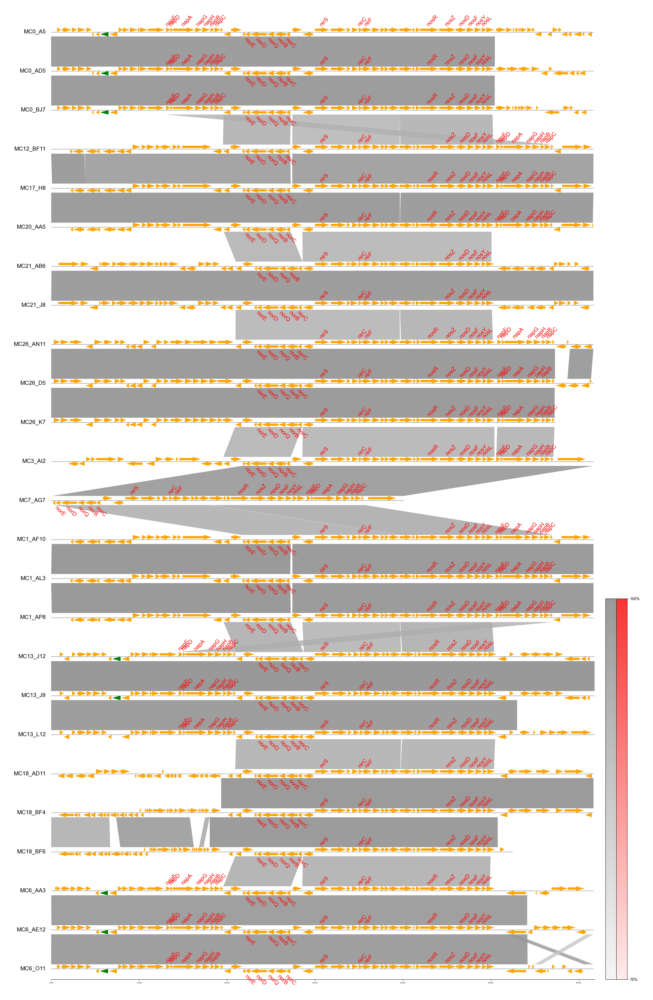

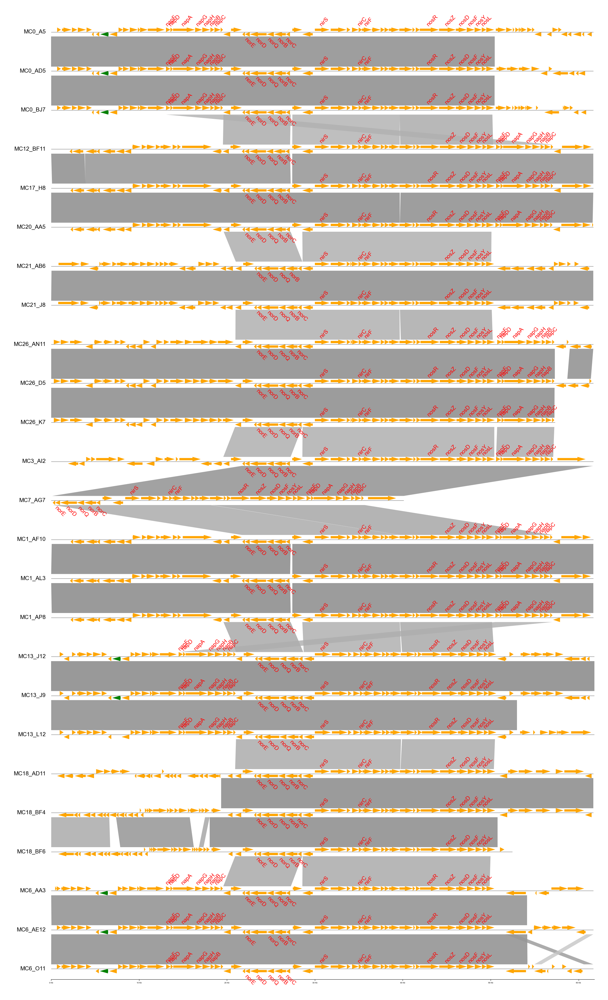

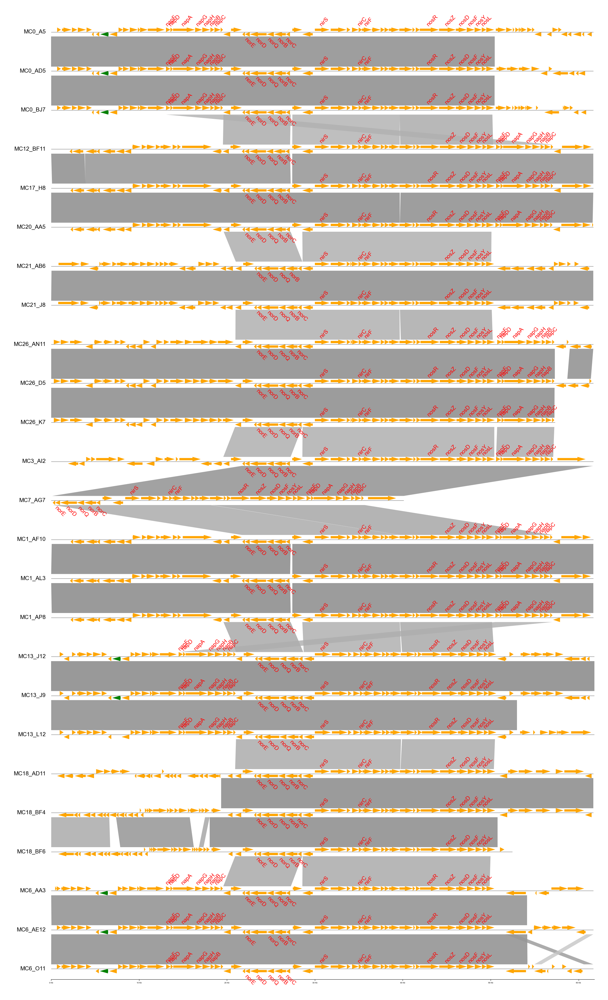

In [108]:
from pygenomeviz import Genbank, GenomeViz
from os.path import *
from tqdm import tqdm

gv = GenomeViz(
    fig_width=20,
    fig_track_height=0.7,
    feature_track_ratio=0.3,
    tick_track_ratio=0.2,
    tick_style="axis",
    tick_labelsize=5,
)
genomes = [genome for genome,contig,start,end,DIRECTION in info]
gbk_list = [Genbank(f'./{genome}_denitrification.gbk') for genome,contig,start,end,DIRECTION in info ]

for genome,gbk in zip(genomes,gbk_list):
    track = gv.add_feature_track(f"{g2pop[genome]}_{genome}", gbk.range_size, labelsize=15)
    track.add_genbank_features(gbk, plotstyle="arrow",label_type='gene')
    for i in track.features:
        label = genome2df[genome].get(i.seq_feature.qualifiers['locus_tag'][0],'')
        #print(label)
        if label in target_genes:
            #print(label,genome)
            i.labelcolor='red'
            i.label = label
            continue
        if 'IS' in '.'.join(i.seq_feature.qualifiers['product']):
            i.facecolor = 'green'
            continue
        i.label = ''
c = []
for genome1,genome2 in zip(genomes,genomes[1:]):
    #genome1 = 'L12'
    #genome2 = 'AB11'
    cmd = f"blastn -task blastn -query ./{genome1}_denitrification.fna -subject ./{genome2}_denitrification.fna -outfmt 6 > {genome1}_{genome2}_blastn.tsv"
    os.system(cmd)
    try:
        df = pd.read_csv(f"{genome1}_{genome2}_blastn.tsv",sep='\t',header=None)
    except:
        continue
    #min_identity = df[2].min()
    for _,row in tqdm(df.iterrows(),total=df.shape[0]):
        g1, s1,e1 = row[0].split('_')[0],row[6],row[7]
        g2, s2,e2 = row[1].split('_')[0],row[8],row[9]
        
        if abs(e1-s1)>=500 and row[2]>=30:
            c.append(row[2])
            gv.add_link((f"{g2pop[genome1]}_{genome1}", s1, e1), (f"{g2pop[genome2]}_{genome2}", s2, e2),
                        v=row[2], vmin=50)
#print(min(c))
fig = gv.plotfig()
_ = gv.set_colorbar(fig,vmin=70,bar_height=0.4,bar_width=0.02)
_ = gv.savefig_html('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/amplicon_related/test.html')
_ = gv.savefig('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/amplicon_related/test.pdf')

In [116]:
genome = 'AB6'
gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/inproteins/{genome}.faa'
_gbk = realpath(gbk).replace('.faa','.gbk')
pinfo = parse_gbk(_gbk)    

In [117]:
pinfo['AB6_02588']

['contig00005', 256636, 257455, -1]

In [118]:
pinfo['AB6_02220']

['contig00004', 223439, 225116, 1]

In [123]:
regions = []
for genome,contig,start,end,DIRECTION in [('AB6', 'contig00004', 193439, 255116, 1),
                                          ('AB6', 'contig00005', 236636, 277455, -1)]:
    genome = 'AB6'
    gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/Merged_popcogeneT/inproteins/{genome}.faa'
    _gbk = {_.id:_ for _ in SeqIO.parse(realpath(gbk).replace('.faa','.gbk'),'genbank')}
    if start <=0:
        start = 0
    if end >= len(_gbk[contig].seq):
        end = len(_gbk[contig].seq)
    _region1 = _gbk[contig][start:end]
    
    if DIRECTION ==-1:
        _region = _region.reverse_complement(id=_region.id,name=_region.name)
        _region.annotations['molecule_type'] =  'DNA'
    regions.append(_region1)
with open(f'./{genome}_denitrification.fna','w') as f1:
    SeqIO.write(regions,f1,'fasta-2line')
with open(f'./{genome}_denitrification.gbk','w') as f1:
    SeqIO.write(regions,f1,'genbank')

In [125]:
info = [('A5', 'contig00007', 82064, 143741, -1),
 ('AD5', 'contig00005', 58059, 119736, 1),
 ('BJ7', 'contig00006', 92425, 154102, 1),
 ('BF11', 'contig00002', 20464, 82141, -1),
 ('H8', 'contig00012', 20441, 82118, -1),
 ('AA5', 'contig00003', 475820, 537497, 1),
 [('AB6', 'contig00004', 193439, 255116, 1),('AB6', 'contig00005', 236636, 277455, 1)],
 ('J8', 'contig00004', 265337, 327014, 1),
 ('AN11', 'AN11_2', 832626, 894303, 1),
 ('D5', 'contig00018', 8681, 70358, -1),
 ('K7', 'contig00018', 11834, 73511, 1),
 ('AI2', 'contig00012', 34884, 96561, 1),
 ('AG7', 'contig00018', -21575, 40102, 1),
 ('AF10', 'contig00002', 20409, 82086, -1),
 ('AL3', 'AL3_2', 757623, 819300, -1),
 ('AP8', 'contig00002', 478439, 540116, 1),
 ('J12', 'contig00005', 277744, 339562, 1),
 ('J9', 'contig00003', 277744, 339562, 1),
 ('L12', 'contig00004', 209406, 271224, -1),
 ('AD11', 'contig00014', 17075, 78752, 1),
 ('BF4', 'contig00007', 71611, 133288, 1),
 ('BF6', 'contig00012', 52467, 114144, 1),
 ('AA3', 'contig00004', 207873, 269550, 1),
 ('AE12', 'contig00004', 233613, 295290, 1),
 ('O11', 'contig00009', 73808, 135485, -1)]

In [132]:

track = gv.add_feature_track(f"{g2pop[genome]}_{genome}", gbk.get_seqid2size(), labelsize=15,space=0.03)

AttributeError: 'Genbank' object has no attribute 'get_seqid2size'

In [140]:
import os
os.chdir('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/keygenestructures')
from pygenomeviz.parser import Genbank
gbk = Genbank('./AB6_denitrification.gbk')
gbk.get_seqid2size()

AttributeError: 'Genbank' object has no attribute 'get_seqid2size'

In [ ]:
from pygenomeviz import Genbank, GenomeViz
from os.path import *
from tqdm import tqdm

gv = GenomeViz(
    fig_width=20,
    fig_track_height=0.7,
    feature_track_ratio=0.3,
    tick_track_ratio=0.2,
    tick_style="axis",
    tick_labelsize=5,
)
genomes = ['AA5','AB6']
gbk_list = [Genbank(f'./{genome}_denitrification.gbk') for genome in ['AA5','AB6'] ]

for genome,gbk in zip(genomes,gbk_list):
    seqid2seq = {str(rec.id): str(rec.seq) for rec in gbk.records}
    seqid2size = {seqid: len(seq) for seqid, seq in seqid2seq.items()}
    track = gv.add_feature_track(f"{g2pop[genome]}_{genome}", seqid2size, labelsize=15,space=0.03)
    #track.add_genbank_features(gbk, plotstyle="arrow",label_type='gene')
    
    for i in track.features:
        label = genome2df[genome].get(i.seq_feature.qualifiers['locus_tag'][0],'')
        #print(label)
        if label in target_genes:
            #print(label,genome)
            i.labelcolor='red'
            i.label = label
            continue
        if 'IS' in '.'.join(i.seq_feature.qualifiers['product']):
            i.facecolor = 'green'
            continue
        i.label = ''
c = []
for genome1,genome2 in zip(genomes,genomes[1:]):
    #genome1 = 'L12'
    #genome2 = 'AB11'
    cmd = f"blastn -task blastn -query ./{genome1}_denitrification.fna -subject ./{genome2}_denitrification.fna -outfmt 6 > {genome1}_{genome2}_blastn.tsv"
    os.system(cmd)
    try:
        df = pd.read_csv(f"{genome1}_{genome2}_blastn.tsv",sep='\t',header=None)
    except:
        continue
    #min_identity = df[2].min()
    for _,row in tqdm(df.iterrows(),total=df.shape[0]):
        g1, s1,e1 = row[0].split('_')[0],row[6],row[7]
        g2, s2,e2 = row[1].split('_')[0],row[8],row[9]
        
        if abs(e1-s1)>=500 and row[2]>=30:
            c.append(row[2])
            gv.add_link((f"{g2pop[genome1]}_{genome1}", s1, e1), (f"{g2pop[genome2]}_{genome2}", s2, e2),
                        v=row[2], vmin=50)
#print(min(c))
fig = gv.plotfig()
_ = gv.set_colorbar(fig,vmin=70,bar_height=0.4,bar_width=0.02)
#_ = gv.savefig_html('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/amplicon_related/test.html')
#_ = gv.savefig('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/amplicon_related/test.pdf')

In [106]:
genome2df['AB6']

{'BF6_01793': 'napC',
 'BF6_01794': 'napB',
 'BF6_01795': 'napH',
 'BF6_01796': 'napG',
 'BF6_01797': 'napA',
 'BF6_01798': 'napD',
 'BF6_01799': 'napF',
 'BF6_03932': 'nosL',
 'BF6_03931': 'nosY',
 'BF6_03930': 'nosF',
 'BF6_03929': 'nosD',
 'BF6_03928': 'nosZ',
 'BF6_04719': 'nosR',
 'BF6_03919': 'nirF',
 'BF6_03918': 'nirC',
 'BF6_03914': 'nirS',
 'BF6_03912': 'norC',
 'BF6_03911': 'norB',
 'BF6_03910': 'norQ',
 'BF6_03909': 'norD',
 'BF6_03908': 'norE'}

In [ ]:
fig = gv.plotfig()
gv.set_colorbar(fig,vmin=70,bar_height=0.2,bar_width=0.02)
gv.savefig('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/amplicon_related/test.pdf')

In [144]:
!sz2 /mnt/ivy/thliao/project/coral_ruegeria/ipynb/amplicon_related/test.pdf

test.pdf                                      100%   12KB  11.7KB/s   00:00    


In [ ]:
c = []
for genome1,genome2 in zip(genomes,genomes[1:]):
    #genome1 = 'L12'
    #genome2 = 'AB11'
    cmd = f"blastn -task blastn -query ./{genome1}_denitrification.fna -subject ./{genome2}_denitrification.fna -outfmt 6 > {genome1}_{genome2}_blastn.tsv"
    os.system(cmd)
    try:
        df = pd.read_csv(f"{genome1}_{genome2}_blastn.tsv",sep='\t',header=None)
    except:
        continue
    #min_identity = df[2].min()
    for _,row in tqdm(df.iterrows(),total=df.shape[0]):
        g1, s1,e1 = row[0].split('_')[0],row[6],row[7]
        g2, s2,e2 = row[1].split('_')[0],row[8],row[9]
        
        if abs(e1-s1)>=1000 and row[2]>=30:
            c.append(row[2])
            gv.add_link((genome1, s1, e1), (genome2, s2, e2),
                        v=row[2], vmin=50)
#print(min(c))
fig = gv.plotfig()
_ = gv.set_colorbar(fig,vmin=70,bar_height=0.4,bar_width=0.02)
_ = gv.savefig_html('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/amplicon_related/test.html')

## only nanopore

In [ ]:
kegg_df_nanopore = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/nanopore_processing/annotations/KEGG_anno_Revised.tsv',sep='\t',index_col=0)
genome2locus = {'A5': 'A5_00289',
 'AL3': 'AL3_04028',
 'AN11': 'AN11_04798',
 'AP11': 'AP11_01491',
 #'H4': nan,
 'BK1': 'BK1_04184',
 'AL7': 'AL7_03609',
 'AB11': 'AB11_00914',
 'AF3': 'AF3_03608'}

In [271]:
target_genes

{'K00370': 'narG',
 'K00371': 'narH',
 'K02567': 'napA',
 'K02568': 'napB',
 'K00368': 'nirK',
 'K15864': 'nirS',
 'K04561': 'norB',
 'K02305': 'norC',
 'K00376': 'nosZ'}

In [292]:
genome_xs = 'A5;AL3;AN11;AP11;H4;BK1;AL7;AB11;AF3'.split(';')
flanking = 30000
genome2locus = kegg_df_nanopore.loc[genome_xs,'K15864'].to_dict()
#genome2locus
info = []
for genome in tqdm(genome_xs):
    if genome not in 'H4'.split(','):
        # H4 lack all denitrification genes
        locus = genome2locus[genome]
    else:
        continue
    gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/nanopore_processing/canu_o/{genome}/09_prokka//{genome}.faa'
    _gbk = realpath(gbk).replace('.faa','.gbk')
    pinfo = parse_gbk(_gbk)    
    if str(locus)=='nan':
        #print(genome)
        continue    
    contig_name, start, end, strand = pinfo[locus]
    info.append((genome,contig_name,start-flanking,end+flanking,strand))
    

100%|██████████| 9/9 [00:06<00:00,  1.38it/s]


In [298]:
info = [('A5', 'A5_1', 225835, 327512, 1),
 ('AL3', 'AL3_2', 737623, 839300, -1),
 ('AN11', 'AN11_2', 812626, 914303, 1),
 ('AP11', 'AP11_1', 1375718, 1477536, 1),
 ('BK1', 'BK1_2', 455834, 554483, 1),
 ('AL7', 'AL7_2', 58034, 159711, 1),
 ('AB11', 'AB11_1', 829228, 930905, -1),
 ('AF3', 'AF3_2', 211361, 313038, 1)]

for genome,contig,start,end,DIRECTION in info:
    gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/nanopore_processing/canu_o/{genome}/09_prokka/{genome}.gbk'
    _gbk = {_.id:_ for _ in SeqIO.parse(gbk,'genbank')}
    if start <=0:
        start = 0
    if end >= len(_gbk[contig].seq):
        end = len(_gbk[contig].seq)
    _region = _gbk[contig][start:end]
    if DIRECTION ==-1:
        _region = _region.reverse_complement(id=_region.id,name=_region.name)
        _region.annotations['molecule_type'] =  'DNA'
    with open(f'./{genome}_denitrification.fna','w') as f1:
        SeqIO.write(_region,f1,'fasta-2line')
    print(genome,len(_region.seq))
    with open(f'./{genome}_{contig}_denitrification.gbk','w') as f1:
        SeqIO.write(_region,f1,'genbank')

A5 101677
AL3 101677
AN11 101677
AP11 101818
BK1 98649
AL7 101677
AB11 101677
AF3 101677


In [300]:
gbk = f'/mnt/ivy/thliao/project/coral_ruegeria/nanopore_processing/canu_o/BK1/09_prokka/BK1.gbk'
_gbk = {_.id:_ for _ in SeqIO.parse(gbk,'genbank')}

In [304]:
[_.qualifiers['locus_tag'][0] for _ in _gbk['BK1_2'].features if _.type=='CDS']

['BK1_03734',
 'BK1_03735',
 'BK1_03736',
 'BK1_03737',
 'BK1_03738',
 'BK1_03739',
 'BK1_03740',
 'BK1_03741',
 'BK1_03742',
 'BK1_03743',
 'BK1_03744',
 'BK1_03745',
 'BK1_03746',
 'BK1_03747',
 'BK1_03748',
 'BK1_03749',
 'BK1_03750',
 'BK1_03751',
 'BK1_03752',
 'BK1_03753',
 'BK1_03754',
 'BK1_03755',
 'BK1_03756',
 'BK1_03757',
 'BK1_03758',
 'BK1_03759',
 'BK1_03760',
 'BK1_03761',
 'BK1_03762',
 'BK1_03763',
 'BK1_03764',
 'BK1_03765',
 'BK1_03766',
 'BK1_03767',
 'BK1_03768',
 'BK1_03769',
 'BK1_03770',
 'BK1_03771',
 'BK1_03772',
 'BK1_03773',
 'BK1_03774',
 'BK1_03775',
 'BK1_03776',
 'BK1_03777',
 'BK1_03778',
 'BK1_03779',
 'BK1_03780',
 'BK1_03781',
 'BK1_03782',
 'BK1_03783',
 'BK1_03784',
 'BK1_03785',
 'BK1_03786',
 'BK1_03787',
 'BK1_03788',
 'BK1_03789',
 'BK1_03790',
 'BK1_03791',
 'BK1_03792',
 'BK1_03793',
 'BK1_03794',
 'BK1_03795',
 'BK1_03796',
 'BK1_03797',
 'BK1_03798',
 'BK1_03799',
 'BK1_03800',
 'BK1_03801',
 'BK1_03802',
 'BK1_03803',
 'BK1_03804',
 'BK1_

In [278]:

nanopore_locus2ko = {locus: ko
            for ko, _d in kegg_df_nanopore.to_dict().items()
            for genome, locus_list in _d.items()
            for locus in str(locus_list).split(',')}

cog_df = pd.read_csv('/mnt/ivy/thliao/project/coral_ruegeria/nanopore_processing/annotations/COG_HMMannotated.tsv',sep='\t',index_col=0)
l2gene_name = cog_df['related genes'].to_dict()
named_genes = [f'nap{i}' for i in 'FDAGHBC'] + ['nirQ','nirC','nirF','norE','norD','norQ','norB','norC','nirS'] + [f'nos{i}' for i in 'RZDFYL'] 

In [279]:
nameconv = {}
for k,v in genome2df['AL3'].items():
    if v in named_genes:
        nameconv[nanopore_locus2ko[k]] = v

In [280]:
circular_contigs = defaultdict(list)
for row in open('/home-user/thliao/project/coral_ruegeria/nanopore_processing/canu_o/chromosome.txt').read().strip().split('\n'):
    circular_contigs[row.split('\t')[0]].append(row.split('\t')[1] )


In [ ]:
gbk = Genbank(f'./BK1_BK1_2_denitrification.gbk')
dir(gbk)

100%|██████████| 55/55 [00:00<00:00, 5682.92it/s]


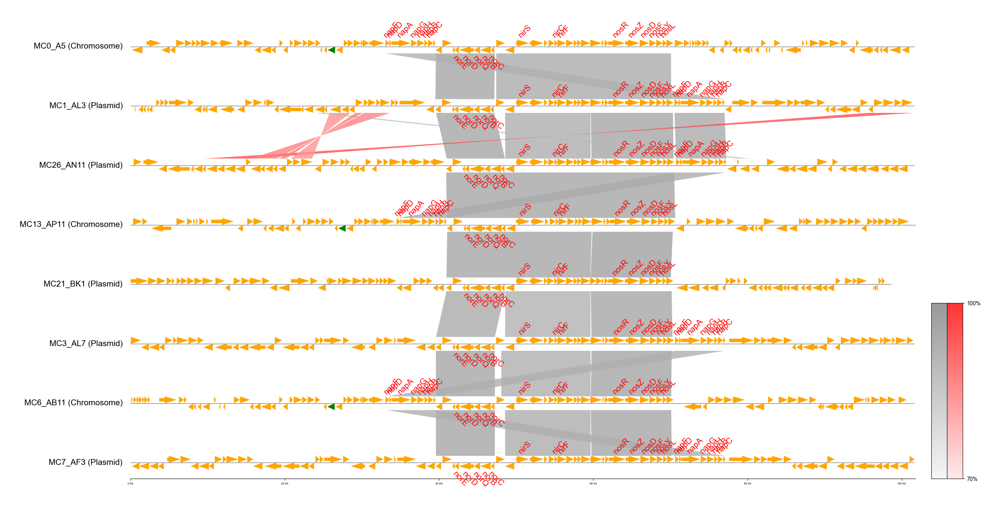

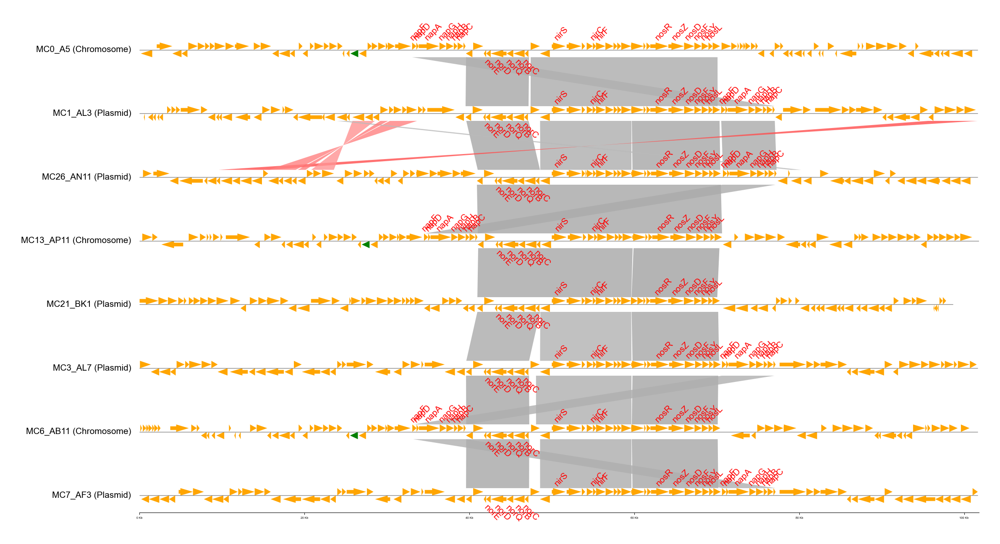

In [281]:
from pygenomeviz import Genbank, GenomeViz
from os.path import *
from tqdm import tqdm

info[('A5', 'A5_1', 225835, 327512, 1),
 ('AL3', 'AL3_2', 737623, 839300, -1),
 ('AN11', 'AN11_2', 812626, 914303, 1),
 ('AP11', 'AP11_1', 1375718, 1477536, 1),
 ('BK1', 'BK1_2', 455834, 557511, 1),
 ('AL7', 'AL7_2', 58034, 159711, 1),
 ('AB11', 'AB11_1', 829228, 930905, -1),
 ('AF3', 'AF3_2', 211361, 313038, 1)]

gv = GenomeViz(
    fig_width=20,
    fig_track_height=0.7,
    feature_track_ratio=0.3,
    tick_track_ratio=0.2,
    tick_style="axis",
    tick_labelsize=5,
)
genomes = [genome for genome,contig,start,end,DIRECTION in info]
gbk_list = [Genbank(f'./{genome}_{contig}_denitrification.gbk') for genome,contig,start,end,DIRECTION in info ]
genome2rowname = {}
for genome,gbk in zip(genomes,gbk_list):
    contig = gbk.name.split('_',1)[1].rsplit('_',1)[0]
    if contig in circular_contigs[genome]:
        rowname = f"{g2pop[genome]}_{genome} (Chromosome)"
    else:
        rowname = f"{g2pop[genome]}_{genome} (Plasmid)"
    genome2rowname[genome] = rowname
    track = gv.add_feature_track(rowname, gbk.range_size, labelsize=15)
    track.add_genbank_features(gbk, plotstyle="arrow",label_type='gene')
    for i in track.features:
        label = nameconv.get(nanopore_locus2ko.get(i.seq_feature.qualifiers['locus_tag'][0],''),'')
        #print(label)
        if label in named_genes:
            #print(label,genome)
            i.labelcolor='red'
            i.label = label
            continue
        if 'IS' in '.'.join(i.seq_feature.qualifiers['product']):
            i.facecolor = 'green'
            continue
        i.label = ''
c = []
for genome1,genome2 in zip(genomes,genomes[1:]):
    #genome1 = 'L12'
    #genome2 = 'AB11'
    cmd = f"blastn -task blastn -query ./{genome1}_denitrification.fna -subject ./{genome2}_denitrification.fna -outfmt 6 > {genome1}_{genome2}_blastn.tsv"
    os.system(cmd)
    try:
        df = pd.read_csv(f"{genome1}_{genome2}_blastn.tsv",sep='\t',header=None)
    except:
        continue
    #min_identity = df[2].min()
    for _,row in tqdm(df.iterrows(),total=df.shape[0]):
        g1, s1,e1 = row[0].split('_')[0],row[6],row[7]
        g2, s2,e2 = row[1].split('_')[0],row[8],row[9]
        
        if abs(e1-s1)>=500 and row[2]>=30:
            c.append(row[2])
            gv.add_link((genome2rowname[genome1], s1, e1), 
                        (genome2rowname[genome2], s2, e2),
                        v=row[2], vmin=50)
#print(min(c))
fig = gv.plotfig()
_ = gv.set_colorbar(fig,vmin=70,bar_height=0.4,bar_width=0.02)
#_ = gv.savefig_html('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/test.html')
_ = gv.savefig('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/Denitrification_arrangment.pdf')

# add coevolved locus

In [214]:
og_table = '/mnt/ivy/thliao/project/coral_ruegeria/ipynb/paper_denitrification/AncestralReconstruction/OG_results/of_out/Results_Dec12/Orthogroups/Orthogroups.tsv'
og_df = pd.read_csv(og_table,sep='\t',index_col=0)


In [215]:
OG_set1 = a
OG_set2 = b
shared_OG = set(OG_set1).intersection(set(OG_set2))
print(len(shared_OG))
union_OG = set(OG_set1).union(set(OG_set2))
print(len(union_OG))


subog_df = og_df.loc[shared_OG,:]
unionog_df = og_df.loc[union_OG,:]

36
107


In [220]:
all_locus = set([v.strip() for _v in unionog_df.values.flatten() for v in str(_v).split(',')])

100%|██████████| 38/38 [00:00<00:00, 5631.73it/s]


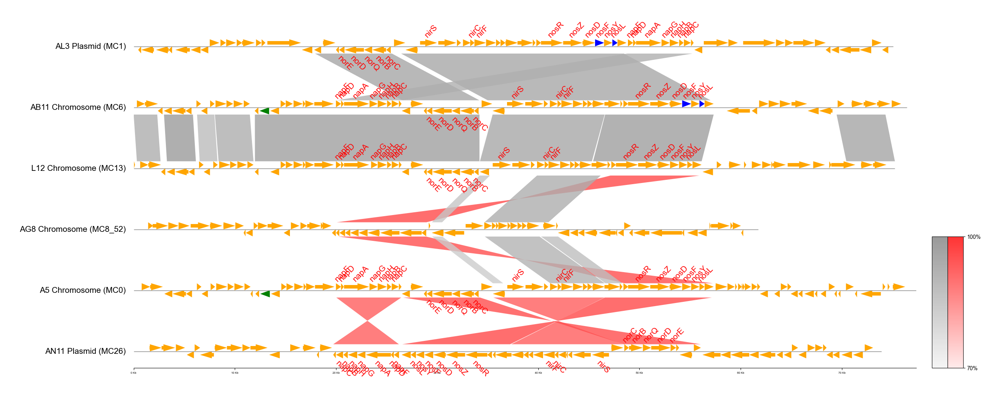

In [223]:

target_genes = [f'nap{i}' for i in 'FDAGHBC'] + ['nirQ','nirC','nirF','norE','norD','norQ','norB','norC','nirS'] + [f'nos{i}' for i in 'RZDFYL'] 

gv = GenomeViz(
    fig_width=20,
    fig_track_height=0.7,
    feature_track_ratio=0.3,
    tick_track_ratio=0.2,
    tick_style="axis",
    tick_labelsize=5,
)
genomes = [genome for genome,contig,start,end,DIRECTION in info]
gbk_list = [Genbank(f'./{genome}_denitrification.gbk') for genome,contig,start,end,DIRECTION in info ]

for gbk in gbk_list:
    track = gv.add_feature_track(rename_gid(gbk.name), gbk.range_size, labelsize=15)
    track.add_genbank_features(gbk, plotstyle="arrow",label_type='gene')
    for i in track.features:
        label = genome2df[gbk.name.split('_')[0]][i.seq_feature.qualifiers['locus_tag'][0]]
        if i.seq_feature.qualifiers['locus_tag'][0] in all_locus:
            i.facecolor='blue'
            
        if label in target_genes:
            i.labelcolor='red'
            i.label = label
            continue
            
        if 'IS' in '.'.join(i.seq_feature.qualifiers['product']):
            i.facecolor = 'green'
            continue
        i.label = ''
c = []
for genome1,genome2 in zip(genomes,genomes[1:]):
    #genome1 = 'L12'
    #genome2 = 'AB11'
    cmd = f"blastn -task blastn -query ./{genome1}_denitrification.fna -subject ./{genome2}_denitrification.fna -outfmt 6 > {genome1}_{genome2}_blastn.tsv"
    os.system(cmd)
    df = pd.read_csv(f"{genome1}_{genome2}_blastn.tsv",sep='\t',header=None)
    #min_identity = df[2].min()
    for _,row in tqdm(df.iterrows(),total=df.shape[0]):
        g1, s1,e1 = row[0].split('_')[0],row[6],row[7]
        g2, s2,e2 = row[1].split('_')[0],row[8],row[9]
        
        if abs(e1-s1)>=1000 and row[2]>=30:
            c.append(row[2])
            gv.add_link((rename_gid(g1), s1, e1), (rename_gid(g2), s2, e2),
                        v=row[2], vmin=50)
#print(min(c))
fig = gv.plotfig()
_ = gv.set_colorbar(fig,vmin=70,bar_height=0.4,bar_width=0.02)
#_ = gv.savefig_html('/mnt/ivy/thliao/project/coral_ruegeria/ipynb/amplicon_related/test.html')

In [ ]:
### new